<a href="https://colab.research.google.com/github/ichko/ml-playground/blob/master/boids_%26_deep_dream.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage import io
import numpy as np
import torchvision
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


torch.__version__

'1.9.0+cu102'

In [2]:
rand_field = torch.rand(1, 256, 256) * 2 * np.pi
xx = torch.cos(rand_field)
yy = torch.sin(rand_field)
mesh = torch.cat([xx, yy], dim=0)
mesh.shape

torch.Size([2, 256, 256])

In [3]:
def plot(mesh):
    zeros = torch.zeros(1, *mesh.shape[1:])
    mesh_3d = torch.cat([mesh, zeros], dim=0) * 0.5 + 0.5
    mesh_3d = mesh_3d.permute(1, 2, 0).detach().cpu().numpy()
    io.imshow(mesh_3d)

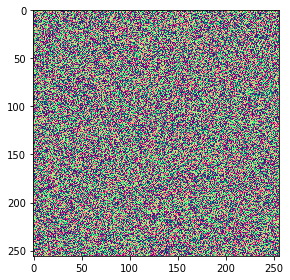

In [4]:
plot(mesh)

In [5]:
model = torchvision.models.vgg11(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth


  0%|          | 0.00/507M [00:00<?, ?B/s]

In [14]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): ReLU(inplace=True)
    (13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): ReLU(inplace=True)
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

In [15]:
layer = model.features[3]

In [16]:
idx = 2
weight = layer.weight[idx:idx+2, idx:idx+2]
weight.shape

torch.Size([2, 2, 3, 3])

In [17]:
# layer = nn.Conv2d(in_channels=2, out_channels=2, kernel_size=(5, 5), stride=1, padding='same')

In [18]:
nn.Conv2d??

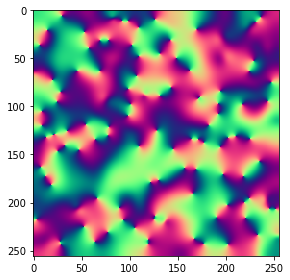

In [19]:
x = mesh

for i in range(50):
    kernel_size = 5
    x = F.avg_pool2d(x, kernel_size=(kernel_size, kernel_size), stride=1, padding=kernel_size // 2)
    # x = F.conv2d(x.unsqueeze(0), weight, stride=1, padding='same')[0]
    x = F.normalize(x, p=2, dim=0)

plot(x)

---

In [22]:
doge = 'https://static.wikia.nocookie.net/dogelore/images/9/97/Doge.jpg/revision/latest/scale-to-width-down/620?cb=20190205113053'
bliss = 'https://upload.wikimedia.org/wikipedia/en/2/27/Bliss_%28Windows_XP%29.png'
iliya = 'https://scontent.fsof8-1.fna.fbcdn.net/v/t1.6435-9/48398405_2218530618171041_6744355254776627200_n.jpg?_nc_cat=101&ccb=1-5&_nc_sid=174925&_nc_ohc=_nrIzJJm3JAAX8MtXOK&_nc_ht=scontent.fsof8-1.fna&oh=e252da5cf82fc07c73db7793e19ca8a1&oe=616F80FC'
tonka = 'https://scontent.fsof8-1.fna.fbcdn.net/v/t1.6435-9/240900528_10223248197011542_1569274760521175742_n.jpg?_nc_cat=104&ccb=1-5&_nc_sid=09cbfe&_nc_ohc=0JNtvhtRP44AX99jkAP&_nc_ht=scontent.fsof8-1.fna&oh=7f69fe6f851f5e6879a17e9cacf0bc53&oe=616CF8CA'
ilia_face = 'https://lh3.googleusercontent.com/toQSUZel4K0XSr03kKtYIkTWHifx2jBvViThN4VcKS2BTHZzjYMNktWB2DD9piNoQPtxkTCdH94WWjD-p66A4QjZSPtDq-fIa-J_Ay3thP5vf6G4CwvPB2yKHwciV8bX8eq3im7X18VxbqzKuC249-N3G4j34ZKJFcRRYkERmJV84e4LdIFYEg6Oa821iL8jmUo_7an_ELIVeZPKjC5wvBJMbPcfRVCgPcXgcW2hnNs2lwDQOOZAe3lPaUfGjEsRdgziCC4koagR6Vc7xUv6XuusNgALZH52pGMtkOTEAVYr8fx4YF8SjH42A6lFEcdGHiOLQgGtuBpQpLPD3bjk-x-loV0UFlIXoG3A37YotbwhzmZNTm-2_HRM7rkHDEqC4TN1OMf6qpMszCjDdtD9pYl--yXK-ZOurFu6Dtq_eOjErRorEfPyhFDB-R-iCiHQCjfns3gvo1pxBUbzbNEG5Kwgvz4Z1s3qDe6eKeeOBZDtTQNmruwqlcW1hghwuqcVvdt8xaTXw8pg6XkqdGVHgUTuUud89JGvUMyPMFJ0aorRfCGKqyaI7odR_keBthpbSIYR1ZPTCwLNb2XfF_lRi6dXpzhpD5TDQU9UOJmlXxDGbWF6yTJgEfkqtkLcQevSZYRJa2NejgzuqCqB6dasl41HBv452ut7fh_zmq_G31qPhgjYdTr8sqobJyazOYILSbFVmDiU1tVZzcqDag2kvA52=s676-no?authuser=0'
iliya_with_cat = 'https://lh3.googleusercontent.com/fife/AAWUweXuzVs8nfUWJR6Zm8VjEcxh7PcOARJewwEmgEQ0kQAYhZQlAmOFJJPWjrL1HGOjXlixvuiTWiAwwB6tCQ3UkqmjW61c_M0024Zzx62vORUappZq3gSp7mptiVouF9bLMrmUSanK0Vc-q8ub9a_b6POm71Wqfz5iPyjnXDMRh_BSPwpgrO0m3sVtYo1LhcNQHx9Y2fnJ_FS-ws50EwCbsrfU6SQk7e_hslOTHiNm6Xoj-gJvDYvK9Mqnmy6Fyd_3PX6-jvxkjzlaYRMyFMdgjD4sftWLi1JN_FgIxOL-vSRMeMyaiJrk3g98xH-Wu4i0ifv9s9JYBkx0O1CPUpPPMKa7p1HjuMtp5vq5Pgz5q-9YZym8hv2jumrPqWoSsb_k1o9zuyuq009pgsFVIhZQKZAWp_bp36gTbiQI6dNRC7UPufDt53J5kqP6qsW4ufnA-92ZWfUQKGdhKzkNImqCLOkQKRE3Dhx2ZnKiiV1_AyCFSDI9NMi9kKqDW1glubuzF9Qdc_pFCHHdIJASHAEq_mVQkm1cnR8JB2SOb1LjALgyKXO5GV4tK80f5C5RbuBzT3QzAQ1L8WIUEFaxHZXEvtQA7NVsx7OpVGxFIUbhLPBni2jSAw6fwIfr7d8GJ5Evtcz8Nnuen9BPFdPOJEW0mr-syaMbkihwWK8q-YPrFWsfpzkSAsYdpHbmhe2FFqsin4NKr2QGo8EkOTD1USfYwoFzhlQrSlzPhBUSyXroNhPizjP4rUz_dvS_qJS8-219IxDOAWZevgB0eOfYsiBx1XuxWI11dPQXS0sE8PJ57ahg5KGXKWbOgFj5v2PbTlKkYwEjx-btXnYgmN5sjCD7hS3b4rcScc7am6xPlIQqlTk9SDq-Wdoyv_LVxjpOO7dTT7RNqxTfqM8C5uCUcbI92L3OsAw5gJBvuewIPxH-7LThUfCFIEGnW6lm9Ep6_6FsRC0-Ug8mnCkHN1Azpy3klacJ-knqvjTgKO5yGt1HU8nXfihuOfmzGCuPNlm7enfw_dBRfhdPwcUeky1SWOVqOhWoghbWgyslBJF_Jnccj0ulkQxVQydUmHnCqubDhiuIgW107QUpYNyskhyl8w-40NYgEiqP9Z36p6K6PiYeAD759uOMuQ3iF7QYBgodfiZDm6xhcab9-DBOyn0RyhdO-4QeqqO9f5k_tOhwMSY66VBiN6y1xKy6Ga3jYVfCArCZmdrSBKrGxZ7gIVW3Tv1lLlIsSUf5S9Ot0wUC0cJWs61oJQdxscFxYE7ET-gj9NslhBp005nTWxhpo5ksHtqnviIvej--TVVlf4eDOwpwn7D1G2ZKZbXImHiqHoGuiT80Tz6642vnp9DbrHwvTZPyJeosLYUQEcog4IxuJtfmtH1CP7B0vQex8xqByiGvv7O7vVEUoK2FE9HTCn_zL3ouKHyYwxg5PFT0UAeXdj1-r4FFX752r7YDC93nCL_KhsTjCSQJsKjpSlsygfEXLNXV43dr7xevZuWn-APanjHNfNQ96CdjpXqmoGKmLTkPny8zN_tE-d17qa5HDn5j4DNiN8luYYnvknXzeGiILh7qVNJGh28g_8xNs7AEtaUuyEAAUBjrG18FohV9nfz3k8Zp8fWr7fXx2ZmOdmCL0h4K7RzejC4kZ_0W8dr8ASDUslHVi7yUCVwqGn_XjpzaV4Mdw2dWaSpYNtdWbDKxzLQhWmFL9Y6nAq2NtdZEQg4G4s91Mxt4hzWOHk9O-K3ZLYJ92-jHUPg2qtPaWrIGxDQ3woSypK0dqggJ_USRqEOEjsYF8yms28TO-QPXOzXh2aLyp_e3F8W54EjIkpYdrjQvdhrPcIj9BNf0hQUj0olAObASwdxPqqfXsN3Pg_BiYJ_GiFe1UyNx_aDEy-s6wcqCpBOsnfJI_WnCqQM5AiRRvn_5L_YLXTwROprsHO1xTCDG6bIY1ez2u9adtx8d6p7RZCf7D5iHPA3mguvVapYAmnepq0IBzelVCdgzmpodaaEBCgT_2z2ssiQVCaYeFBP4eaIhtr9XOvxic0DGTyeuKVSQZlXzN2BEb_uuR-gkGso5mYz4I32mdcMXAc--xuT9D-uFboxzeN-S6ioN_NSrhPZkqH-8Hu0-I6J6x780zpharTQ1QjTeSp0KnV4LNB84Gz6J7nSDubbRqzXS7-cFd0FIx3yWL6SDecCn2q70LoRWgho9bxR671BrXbq571DxFO6WLnQJyx1MD9VbUA86eAb7mgSKePEzxaC3cvcLl6hgR3PZj0t4yJyBjFV2tSHANvAPkGwgI5KWRJ80vF7lPC6vZ6YVJUfL-Qn2iE79psm0ipZMyKpiBYiA_S3PIWa6oFJGtV8fOBUhlhYO00daRr6pzJf5-lOvqjBpzqQYFV6bZPSLMuSlgR76g9KYlojJBzFWxKCt0BqKMkoqjgXPnwGejcPsKlHvW7FtCqjp22xRA8LDYvvenPQP2sM9dy9iP0mgGjC58GsTZSuC7e6LOlAO2zUEQbaZB-7vL3TP6Nm8fgoKKsDzFBaigyaBgjItMIyJqMt0yhLuuARLgzymkFYA6YIbQ1p05iXyYQxNR6WcpoZArGyI8UMlgypVH0JYub2L7wd2L4iAudm0fL6TIW_Yf7zO7oeKFhmghA1dpK8nJplbhMmo4gXNVdQDqr55AVpn0nvGVrQWQYZAGkbChgfb-SwtHt9UQG8PbC0-Wqe2yFN5ioOwQES22tdqXoA4x7z9pD4m47101mSmcd_tBiey2BzCn4gbGP0_x4xbFtzMQBv23kKGI9-CbYHNHG6fkz5JVKfUq6I3syulyVmWgJyFz2EcGZ7JL70nUT59YVTLHvjcvC0SDnI-n06E6sfXO550xeoexQ-5skXJn2bdKTO7wFo_n5HQkfSZtPBQ81K_emoM1KAa-oLLnESNHxvbYVMp_TlhrjhZY5Z876vxVIBbhquLaNebu1Mp4nxeggfUVsXzl5jj4x4er80ZnaCD49P4zZr1SwW05CsMwpX3OLiyTOddqfgviYjsPKMbal-Kp_p1cI4UMDieM3oYD4ghxSbyfwwBzS3Pycu_fPAMiXx0bG8LaUO1Cn9GFuYZEQ2T-0XFGJs-sFvQ8B5067S8NnYdPnGcrpwrEJBeH0etX-HNsRsl6aRbAtFTYVulmDvySWnGh1KvfJzn_oVR7OVl-oKOue1Ef4x8uNONkZmw2CbBWhcHZlm0d_3VdnYe50Zv9zZv8caOTvSGv1cRBePtdYgb7nyvyk_TQLWwuSSIL-55u0zaRx_OrWZkICh01SSPfbUBm8KAXoy3hA2Jm8rA1e9iuELDXSygmBi-OVGwwzmYVVpHVAAX2Y39Vbdj2BDJPWgTRu5zOs3eLIpjPvzOyMfcMl235D21ieeScSXV88a0ym1ELVrf8kEXmYCne4L2Q5h7hBonVBUvdN40MLhmDxhVeXOdao74iRFwhy5hUmBoLrimVHU8ko7pJBK-pU53Pf-r-PIeYiNAk5jFN8r4SBENbuztsMF6u-l2uzn2qoM7C736Obg-IBoAXxM2clBQ1yqU0r4OWEx4VFv-_Npk2Ll9tVdmFySmao7aBWF9wpiDO2Bq_yiwd7iMMNsPItr-qCnCk5Ml3hQoA14kPCYFwO9vd04f4bDO8PbLAcKV2EuM6tJw7SXNDAfMQfzhgpvyk37aCa_r8dCmBl4WcnHgpC5hhpCzeh9hW0K4novbIfCAlgJ41fZ-86dgiLT9TaSBt2FyjcFbeTiQ=s1787-w1787-h1340-no?authuser=0'

In [23]:
from PIL import Image
import requests

url = iliya_with_cat
im = Image.open(requests.get(url, stream=True).raw)
img = np.array(im)
img.max()

255

In [24]:
DEVICE = 'cuda'

In [25]:
model = torchvision.models.vgg19(pretrained=True).to(DEVICE)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [26]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [27]:
from torchvision import transforms
from torch.autograd import Variable
from PIL import Image

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

preprocess = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean, std)])

In [28]:
def show_img(img):
    img = img[0].permute(1, 2, 0)
    img = img.detach().cpu().numpy()
    img = img * std.reshape((1, 1, 3)) + mean.reshape((1, 1, 3))
    plt.imshow(img)

def show_img_pil(img):
    img = img[0].permute(1, 2, 0)
    img = img.detach().cpu().numpy()
    img = img * std.reshape((1, 1, 3)) + mean.reshape((1, 1, 3))
    img = img.clip(0, 1)
    img = (img * 255).astype(np.uint8)
    return Image.fromarray(img)

In [29]:
im.size

(1787, 1340)

tensor(-1.8606, device='cuda:0') tensor(2.3088, device='cuda:0') torch.Size([1, 3, 1340, 1787])
torch.Size([1, 3, 37, 50])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([1, 3, 127, 170])


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([1, 3, 217, 290])


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([1, 3, 307, 410])


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([1, 3, 487, 650])


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

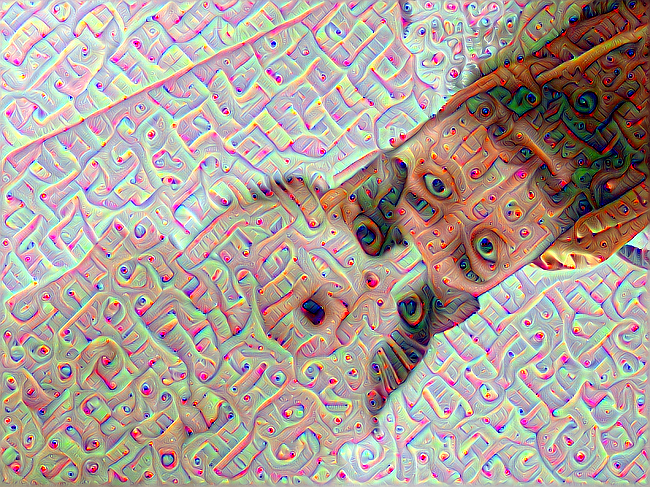

In [245]:
H, W = im.size[-2:]
ar = W / H
o_inp = preprocess(im).unsqueeze(0).to(DEVICE)
detail = torch.zeros_like(o_inp, device=DEVICE)

print(o_inp.min(), o_inp.max(), o_inp.shape)

lr = 0.02

for z in [0, 1, 2, 3, 5]:
    size = 50 + z * 120
    W = int(ar * size)
    H = size
    iter_inp = F.interpolate(o_inp, size=(W, H), mode='bilinear')
    detail = F.interpolate(detail, size=(W, H), mode='bilinear')
    inp = Variable(iter_inp + detail, requires_grad=True)
    print(inp.shape)
    for l in range(4):
        for i in tqdm(range(4)):
            model.features.zero_grad()
            out = model.features[:8 + l * 3](inp)
            lr = 0.005 + z / 5 * 0.035
            loss = torch.norm(out, 1 + z / 5 * 0.5)
            loss.backward()
            avg_grad = np.abs(inp.grad.data.cpu().numpy()).mean()
            norm_lr = lr / avg_grad
            inp.data += norm_lr * inp.grad.data
            inp.grad.data.zero_()

    detail = inp.data - iter_inp 

show_img_pil(inp)

tensor(-1.8606, device='cuda:0') tensor(2.3088, device='cuda:0') torch.Size([1, 3, 1340, 1787])
torch.Size([1, 3, 74, 100])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([1, 3, 187, 250])


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([1, 3, 299, 400])


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([1, 3, 412, 550])


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([1, 3, 524, 700])


  0%|          | 0/8 [00:00<?, ?it/s]

torch.Size([1, 3, 637, 850])


  0%|          | 0/8 [00:00<?, ?it/s]

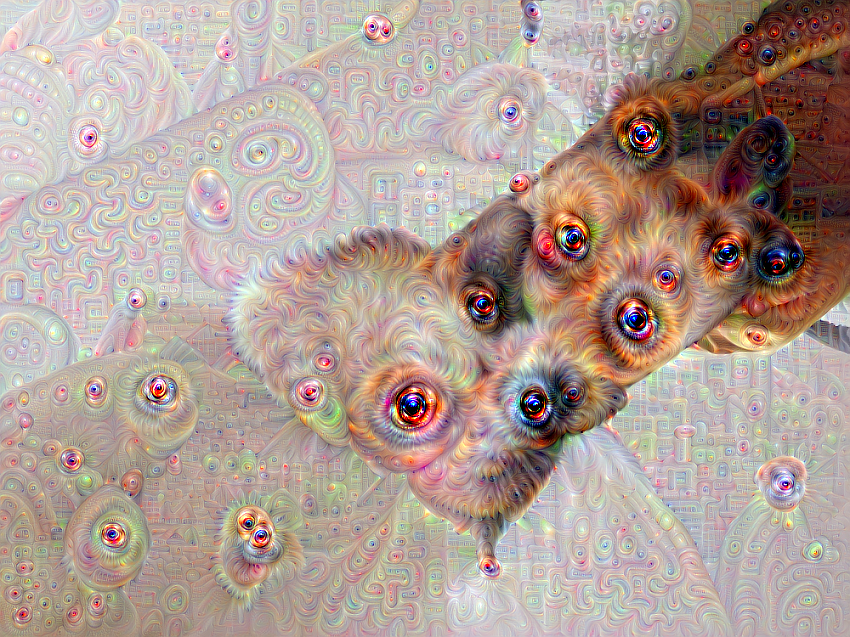

tensor(-1.8606, device='cuda:0') tensor(2.3088, device='cuda:0') torch.Size([1, 3, 1340, 1787])
torch.Size([1, 3, 37, 50])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 112, 150])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 187, 250])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 262, 350])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 337, 450])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 412, 550])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 487, 650])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 562, 750])


  0%|          | 0/10 [00:00<?, ?it/s]

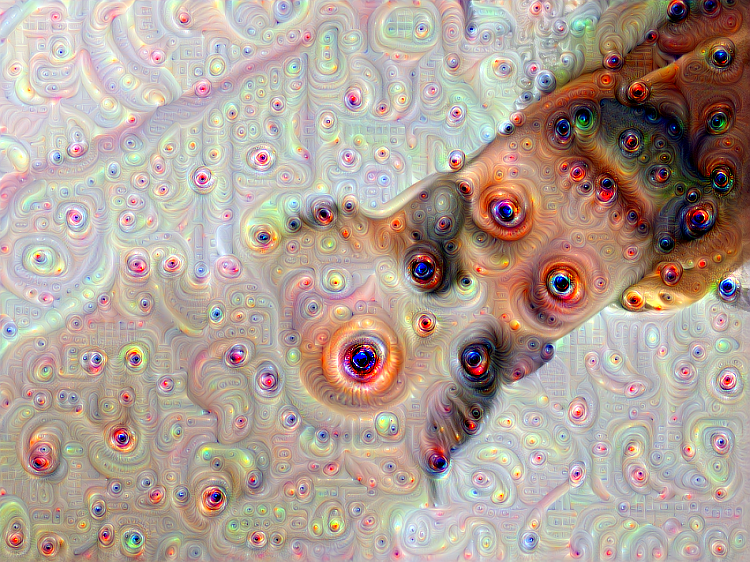

In [ ]:
np.array([1,2,3]).astype

tensor(-1.9832, device='cuda:0') tensor(1.8379, device='cuda:0') torch.Size([1, 3, 676, 676])
torch.Size([1, 3, 50, 50])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 200, 200])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 350, 350])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 500, 500])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 650, 650])


  0%|          | 0/10 [00:00<?, ?it/s]

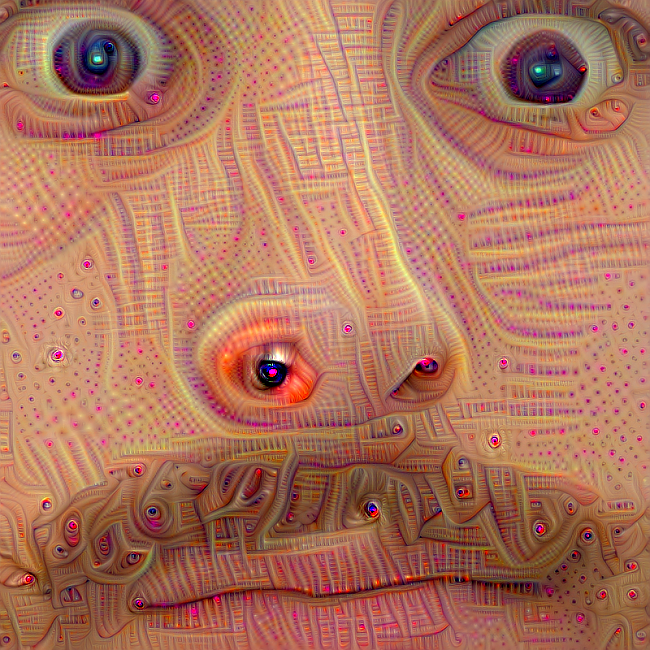

tensor(-1.9832, device='cuda:0') tensor(1.8379, device='cuda:0') torch.Size([1, 3, 676, 676])
torch.Size([1, 3, 130, 130])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 210, 210])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 290, 290])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 130, 130])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 210, 210])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 370, 370])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 530, 530])


  0%|          | 0/6 [00:00<?, ?it/s]

torch.Size([1, 3, 610, 610])


  0%|          | 0/6 [00:00<?, ?it/s]

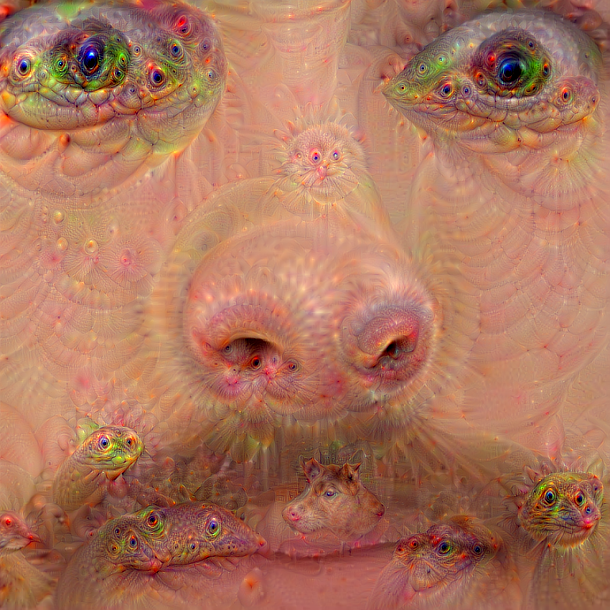

tensor(-1.9832, device='cuda:0') tensor(1.8379, device='cuda:0') torch.Size([1, 3, 676, 676])
torch.Size([1, 3, 140, 140])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 140, 140])


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 320, 320])


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 410, 410])


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 410, 410])


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 500, 500])


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([1, 3, 680, 680])


  0%|          | 0/5 [00:00<?, ?it/s]

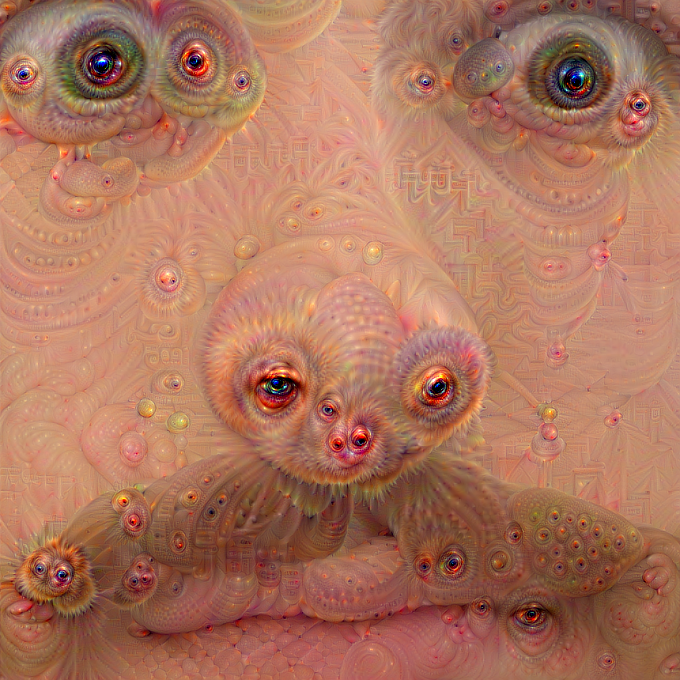

tensor(-1.9832, device='cuda:0') tensor(1.8379, device='cuda:0') torch.Size([1, 3, 676, 676])
torch.Size([1, 3, 180, 180])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 180, 180])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 340, 340])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 420, 420])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 420, 420])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 500, 500])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 660, 660])


  0%|          | 0/10 [00:00<?, ?it/s]

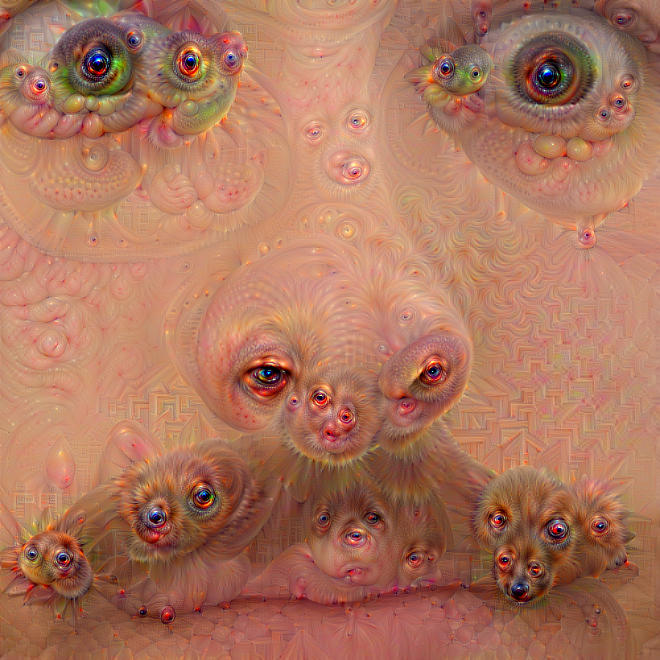

tensor(-2.0494, device='cuda:0') tensor(2.5703, device='cuda:0') torch.Size([1, 3, 1440, 1440])
torch.Size([1, 3, 40, 40])


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 140, 140])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 240, 240])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 340, 340])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 440, 440])


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([1, 3, 540, 540])


  0%|          | 0/10 [00:00<?, ?it/s]

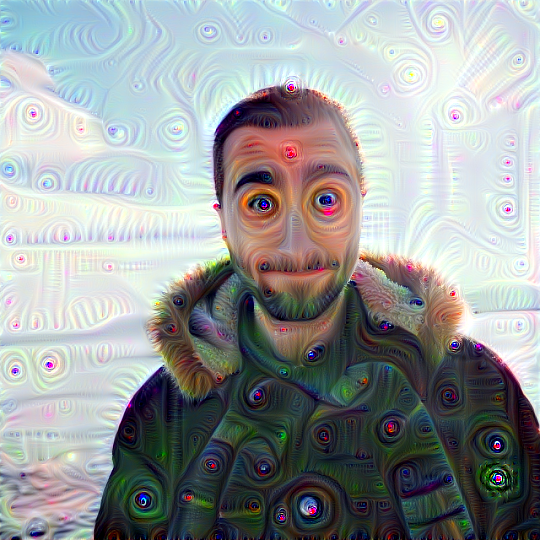

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


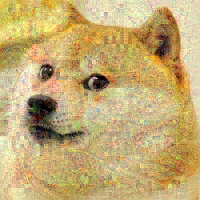

In [ ]:
zoomed = F.interpolate(inp, size=200, mode='bilinear')
show_img_pil(zoomed)

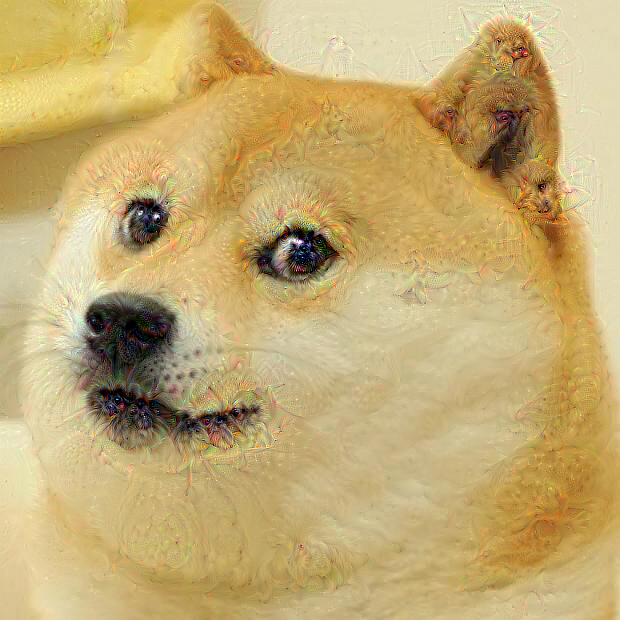

In [ ]:
show_img_pil(inp)

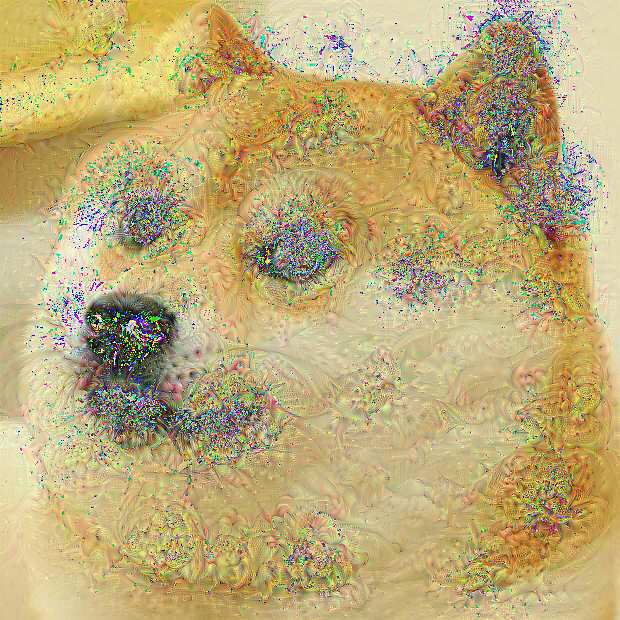

In [ ]:

show_img_pil(inp)

In [ ]:
inp.min()

tensor(-2.1064, device='cuda:0', grad_fn=<MinBackward1>)

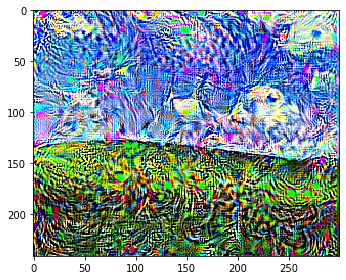

In [ ]:
show_img(inp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


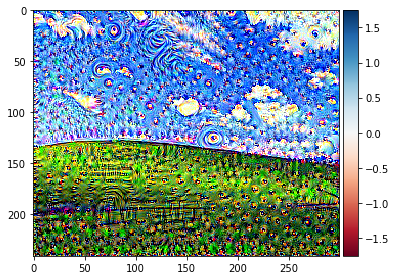

<function _VariableFunctionsClass.bmm>